## Boiler Plate

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

## Importing libaries

In [2]:
import pandas as pd
import pickle
import numpy as np
from fastai.vision import *
from fastai.callbacks.hooks import *
import matplotlib.pyplot as plt
from lshashpy3 import LSHash
from PIL import Image
from tqdm import tqdm_notebook
pd.set_option('display.max_columns', 500)

In [3]:
path = Path('../data/caltech102/')

## Loading Data and Model

In [4]:
tfms = get_transforms(
    do_flip=False, 
    flip_vert=False, 
    max_rotate=0, 
    max_lighting=0, 
    max_zoom=1, 
    max_warp=0
)
data = (ImageList.from_folder(path)
        .split_by_rand_pct(0.2)
        .label_from_folder()
        .transform(tfms=tfms, size=224)
        .databunch(bs=64))

In [5]:
print('Number of classes {0}'.format(data.c))
print(data.classes)

Number of classes 103
['000', '001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064', '065', '066', '067', '068', '069', '070', '071', '072', '073', '074', '075', '076', '077', '078', '079', '080', '081', '082', '083', '084', '085', '086', '087', '088', '089', '090', '091', '092', '093', '094', '095', '096', '097', '098', '099', '100', '101', '102']


In [6]:
## Creating the model
learn = cnn_learner(data, models.resnet34, pretrained=True, metrics=accuracy)

In [28]:
learner = learn.load('stg2-rn34')

## Extracting Feature

In [8]:
# this is a hook (learned about it here: https://forums.fast.ai/t/how-to-find-similar-images-based-on-final-embedding-layer/16903/13)
# hooks are used for saving intermediate computations
class SaveFeatures():
    features=None
    def __init__(self, m): 
        self.hook = m.register_forward_hook(self.hook_fn)
        self.features = None
    def hook_fn(self, module, input, output): 
        out = output.detach().cpu().numpy()
        if isinstance(self.features, type(None)):
            self.features = out
        else:
            self.features = np.row_stack((self.features, out))
    def remove(self): 
        self.hook.remove()
        
sf = SaveFeatures(learn.model[1][5]) ## Output before the last FC layer

## Visualizing Output

In [ ]:
## Loading Feature dictionary
feature_dict = pickle.load(open(path/'feature_dict.p','rb'))
lsh = pickle.load(open(path/'lsh.p','rb'))

In [94]:
def get_similar_item(idx, feature_dict, lsh_variable, n_items=5):
    response = lsh_variable.query(feature_dict[list(feature_dict.keys())[idx]].flatten(), 
                     num_results=n_items+1, distance_func='hamming')
    columns = 8
    rows = int(np.ceil(n_items+1/columns))
    fig=plt.figure(figsize=(4*rows, 6*rows))
    for i in range(1, columns*rows +1):
        if i<n_items+2:
            img = Image.open(response[i-1][0][1])
            fig.add_subplot(rows, columns, i)
            plt.imshow(img)
    return plt.show()

In [95]:
def get_similar_item_vect(vect, feature_dict, lsh_variable, n_items=5):
    response = lsh_variable.query(vect, 
                     num_results=n_items+1, distance_func='hamming')
    
    columns = 8
    rows = int(np.ceil(n_items+1/columns))
    fig=plt.figure(figsize=(4*rows, 6*rows))
    for i in range(1, columns*rows +1):
        if i<n_items+2:
            img = Image.open(response[i-1][0][1])
            fig.add_subplot(rows, columns, i)
            plt.imshow(img)
    return plt.show()

imagenumber = 0


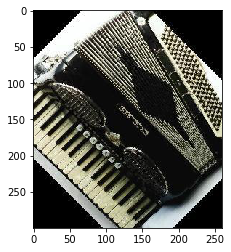

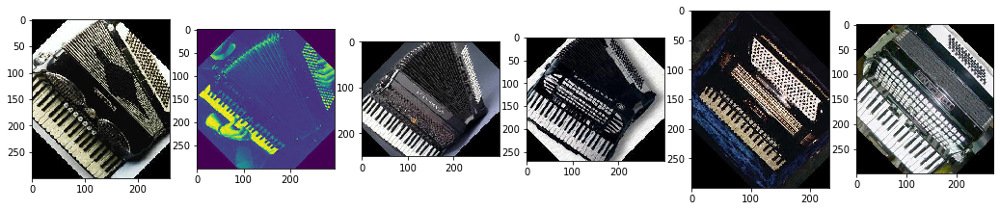

In [96]:
imagenumber = list(feature_dict.keys()).index("..\\data\\caltech102\\000\\1.jpg")
print("imagenumber =", imagenumber)
img = Image.open(list(feature_dict.keys())[imagenumber])
plt.imshow(img)
get_similar_item(imagenumber, feature_dict, lsh,5)

imagenumber = 7324


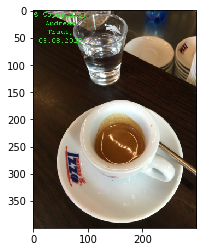

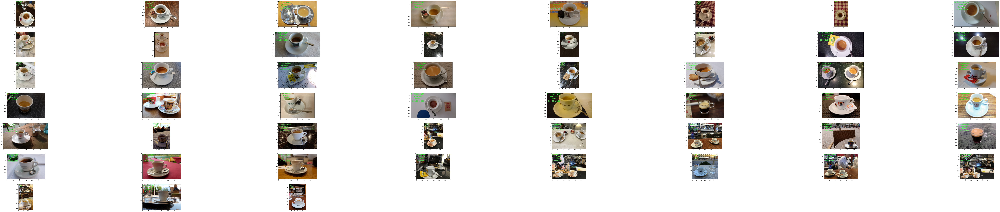

In [97]:
imagenumber = list(feature_dict.keys()).index("..\\data\\caltech102\\102\\9157.jpg")
print("imagenumber =", imagenumber)
img = Image.open(list(feature_dict.keys())[imagenumber])
plt.imshow(img)
get_similar_item(imagenumber, feature_dict, lsh,50)

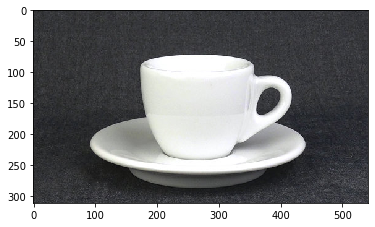

In [98]:
path = '..\\data\\testpictures\\2.jpg'
img = Image.open(path)
plt.imshow(img)

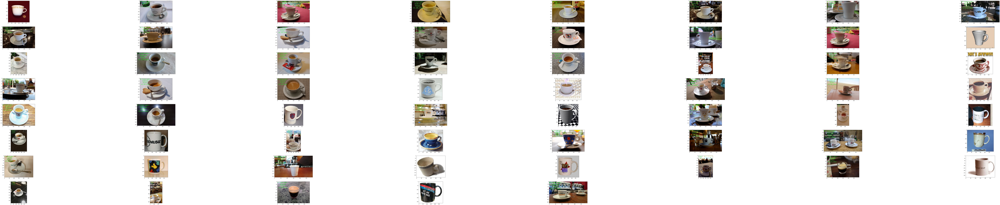

In [100]:
_ = learner.predict(open_image(path))
vect = sf.features[-1]
get_similar_item_vect(vect, feature_dict, lsh,60)